<a href="https://colab.research.google.com/github/miriam-dong/FLIP00/blob/develop/Bike_Sharing_Demand.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Bike Sharing Demand

In [133]:
import numpy as np
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns

In [134]:
train=pd.read_csv('D:/Users/huawei/Documents/GitHub/FLIP00/Data/train.csv',header=0)
test=pd.read_csv('D:/Users/huawei/Documents/GitHub/FLIP00/Data/test.csv',header=0)

train.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
0,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0.0,3,13,16
1,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0.0,8,32,40
2,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0.0,5,27,32
3,2011-01-01 03:00:00,1,0,0,1,9.84,14.395,75,0.0,3,10,13
4,2011-01-01 04:00:00,1,0,0,1,9.84,14.395,75,0.0,0,1,1


In [135]:
print("train:",train.shape)
print("test:",test.shape)

train: (10886, 12)
test: (6493, 9)


In [136]:
print(train.info())
print(test.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    10886 non-null  object 
 1   season      10886 non-null  int64  
 2   holiday     10886 non-null  int64  
 3   workingday  10886 non-null  int64  
 4   weather     10886 non-null  int64  
 5   temp        10886 non-null  float64
 6   atemp       10886 non-null  float64
 7   humidity    10886 non-null  int64  
 8   windspeed   10886 non-null  float64
 9   casual      10886 non-null  int64  
 10  registered  10886 non-null  int64  
 11  count       10886 non-null  int64  
dtypes: float64(3), int64(8), object(1)
memory usage: 1020.7+ KB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6493 entries, 0 to 6492
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    6493 non-null   object 
 1   season      6

In [137]:
train.describe()

,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
count,10886.000000,10886.000000,10886.000000,10886.000000,10886.00000,10886.000000,10886.000000,10886.000000,10886.000000,10886.000000,10886.000000
mean,2.506614,0.028569,0.680875,1.418427,20.23086,23.655084,61.886460,12.799395,36.021955,155.552177,191.574132
std,1.116174,0.166599,0.466159,0.633839,7.79159,8.474601,19.245033,8.164537,49.960477,151.039033,181.144454
min,1.000000,0.000000,0.000000,1.000000,0.82000,0.760000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2.000000,0.000000,0.000000,1.000000,13.94000,16.665000,47.000000,7.001500,4.000000,36.000000,42.000000
50%,3.000000,0.000000,1.000000,1.000000,20.50000,24.240000,62.000000,12.998000,17.000000,118.000000,145.000000
75%,4.000000,0.000000,1.000000,2.000000,26.24000,31.060000,77.000000,16.997900,49.000000,222.000000,284.000000
max,4.000000,1.000000,1.000000,4.000000,41.00000,45.455000,100.000000,56.996900,367.000000,886.000000,977.000000


In [138]:
import seaborn as sns
colors = ["windows blue", "amber", "greyish", "faded green", "dusty purple"]
sns.set_palette("Paired", 8)
#sns.set_palette(sns.xkcd_palette(colors), 8)

Text(0.5, 1.0, 'Overview of the Number of Total Rentals Per Hour')

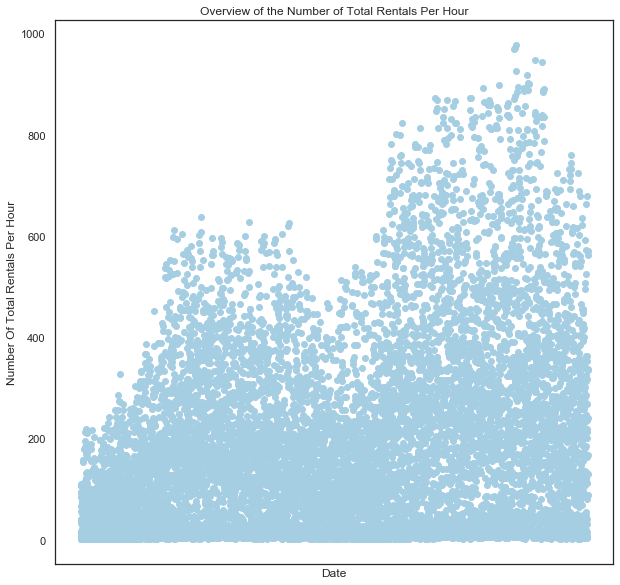

In [139]:
plt.figure(figsize=(10,10))
plt.scatter(train['datetime'],train['count'],label='count')
plt.xlabel('Date')
plt.ylabel('Number Of Total Rentals Per Hour')
plt.xticks([])
plt.title('Overview of the Number of Total Rentals Per Hour')

Text(0.5, 1.0, 'Frequency of the Number of Total Rentals Per Hour')

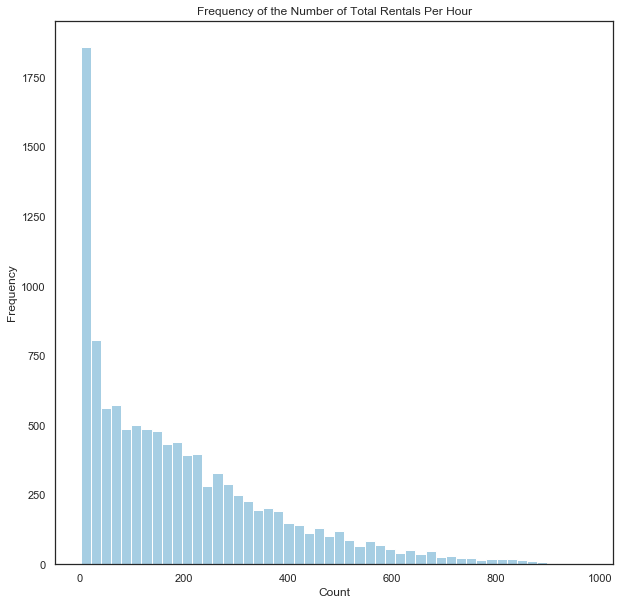

In [140]:
plt.figure(figsize=(10,10))
plt.hist(train['count'],label='count',bins=50)
plt.xlabel('Count')
plt.ylabel('Frequency')
plt.title('Frequency of the Number of Total Rentals Per Hour')

In [141]:
from datetrans import get_date,get_year,get_month,get_weekday,get_hour

train['Date']=train['datetime'].apply(get_date)
train['Year']=train['datetime'].apply(get_year)
train['Month']=train['datetime'].apply(get_month)
train['Week']=train['datetime'].apply(get_weekday)
train['Hour']=train['datetime'].apply(get_hour)

seasonDict={1:'Spring',2:'Summer',3:'Fall',4:'Winter'}
train['season']=train['season'].map(seasonDict)
monthDict = {1:"January",2:"February",3:"March",4:"April",5:"May",6:"June",7:"July",8:"August",9:"September",10:"October",11:"November",12:"December"}
train['Month']=train['Month'].map(monthDict)
weekDict = {0:"Sunday",1:"Monday",2:"Tuesday",3:"Wednesday",4:"Thursday",5:"Friday",6:"Saturday"}
train['Week']=train['Week'].map(weekDict)

train.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,Date,Year,Month,Week,Hour
0,2011-01-01 00:00:00,Spring,0,0,1,9.84,14.395,81,0.0,3,13,16,2011-01-01,2011,January,Friday,0
1,2011-01-01 01:00:00,Spring,0,0,1,9.02,13.635,80,0.0,8,32,40,2011-01-01,2011,January,Friday,1
2,2011-01-01 02:00:00,Spring,0,0,1,9.02,13.635,80,0.0,5,27,32,2011-01-01,2011,January,Friday,2
3,2011-01-01 03:00:00,Spring,0,0,1,9.84,14.395,75,0.0,3,10,13,2011-01-01,2011,January,Friday,3
4,2011-01-01 04:00:00,Spring,0,0,1,9.84,14.395,75,0.0,0,1,1,2011-01-01,2011,January,Friday,4


Visualization of the relationship between bike rental number and time

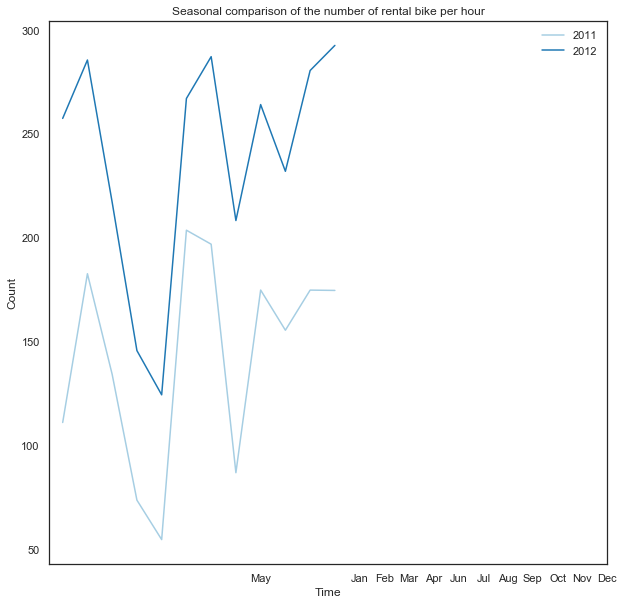

In [142]:
train_year=train.groupby(['Month','Year']).mean().unstack()['count']

plt.figure(figsize=(10,10))
plt.plot(train_year)
plt.xlabel('Time')
plt.ylabel('Count')
plt.title('Seasonal comparison of the number of rental bike per hour')
plt.legend(train['Year'].unique(),loc=0,frameon=False)
plt.xticks( ['Jan', 'Feb', 'Mar', 'Apr','May','Jun', 'Jul', 'Aug','Sep', 'Oct', 'Nov', 'Dec'])
#plt.savefig('season.jpg')
plt.show()

In [143]:
train_year.index 

Index(['April', 'August', 'December', 'February', 'January', 'July', 'June',
       'March', 'May', 'November', 'October', 'September'],
      dtype='object', name='Month')

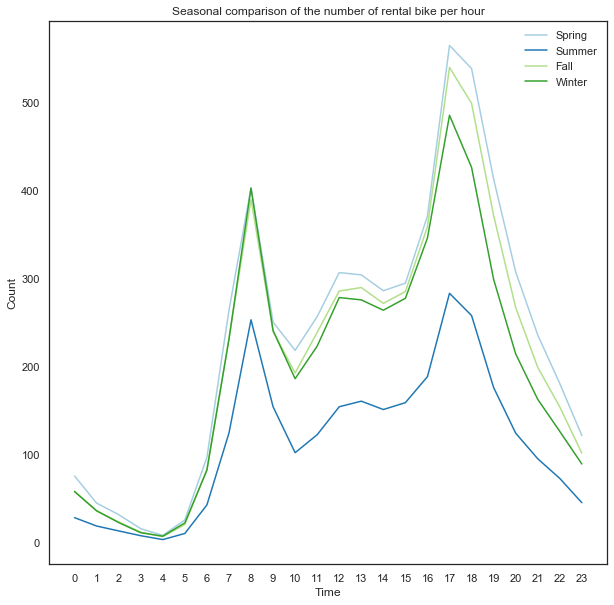

In [144]:
train_season=train.groupby(['Hour','season']).mean().unstack()['count']

plt.figure(figsize=(10,10))
plt.plot(train_season)
plt.xlabel('Time')
plt.ylabel('Count')
plt.title('Seasonal comparison of the number of rental bike per hour')
plt.legend(train['season'].unique(),loc=0,frameon=False)
plt.xticks( np.arange(24) )
#plt.savefig('season.jpg')
plt.show()

从上图我们可以看出，春天的使用量明显偏少，可能是温度较低的原因，同时，早上八点和晚上5点左右使用较多

As can be seen from the above diagram, the usage is obviously lower in spring, probably due to the lower temperature. Meanwhile, the usage is higher around 8 am and 5 PM

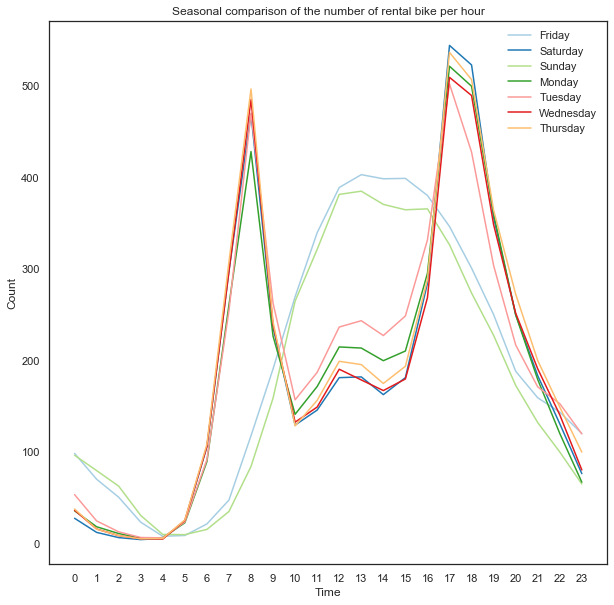

In [145]:
train_week=train.groupby(['Hour','Week']).mean().unstack()['count']

plt.figure(figsize=(10,10))
plt.plot(train_week)
plt.xlabel('Time')
plt.ylabel('Count')
plt.title('Seasonal comparison of the number of rental bike per hour')
plt.legend(train['Week'].unique(),loc=0,frameon=False)
plt.xticks( np.arange(24) )
#plt.savefig('week.jpg')
plt.show()

从上图我们可以看出，周一到周五中，一天中早上8-9点和下午5-7点，使用量比较多，可能是早上上班时间和晚上下班时间导致的，同时包含外出吃饭的原因，而对于周末，时间比较集中，基本在11点到下午5点左右使用量比较多，这个时间估计是大家的休闲时间。

From above we can see, from Monday to Friday, 8 in the morning of the day - 9 am and 5 to 7 PM, usage is more, may be caused by time going to work in the morning and evening after work time, include the reason of eating out at the same time, for the weekend, time is more focused, basic usage around 11 PM to 5 PM,
This time is supposed to be everyone's leisure time.

No handles with labels found to put in legend.


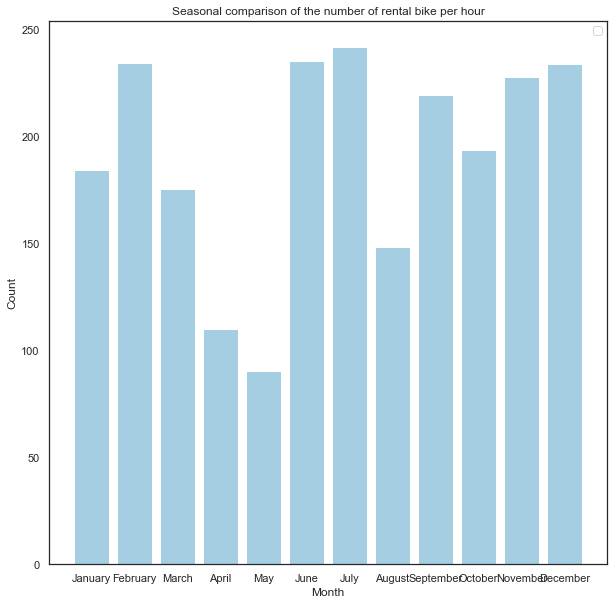

In [146]:
train_month=train.groupby('Month')['count'].mean()

plt.figure(figsize=(10,10))
plt.bar(x=train['Month'].unique(),height=train_month)
plt.xlabel('Month')
plt.ylabel('Count')
plt.title('Seasonal comparison of the number of rental bike per hour')
plt.legend()
#plt.savefig('hol.jpg')
plt.show()

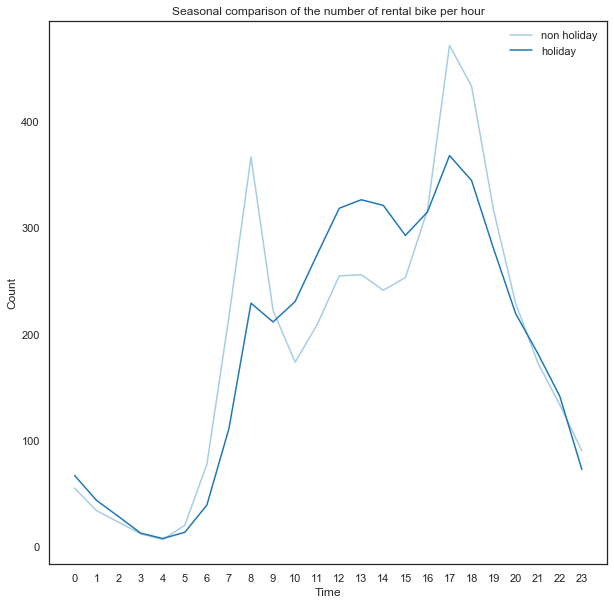

In [147]:
train_holiday = train.groupby(['Hour', 'holiday']).mean().unstack()['count'].rename(columns={0:'non holiday',1:'holiday'})

plt.figure(figsize=(10,10))
plt.plot(train_holiday)
plt.xlabel('Time')
plt.ylabel('Count')
plt.title('Seasonal comparison of the number of rental bike per hour')
plt.legend(list(train_holiday),loc=0,frameon=False)
plt.xticks( np.arange(24) )
#plt.savefig('hol.jpg')
plt.show()




节假日和非节假日使用时间比较接近，但是节假日使用明显高于非节假日。

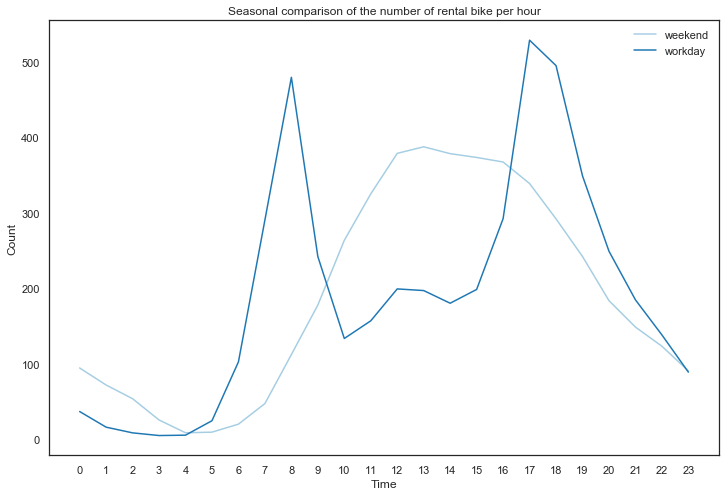

In [148]:
train_workingday = train.groupby(['Hour', 'workingday']).mean().unstack()['count'].rename(columns={0:'weekend',1:'workday'})

plt.figure(figsize=(12,8))
plt.plot(train_workingday)
plt.xlabel('Time')
plt.ylabel('Count')
plt.title('Seasonal comparison of the number of rental bike per hour')
plt.legend(list(train_workingday),loc=0,frameon=False)
plt.xticks( np.arange(24) )
#plt.savefig('hol.jpg')
plt.show()


明显可以看到，周末和工作日，单车的使用主要集中在不同时间

The influence of temperature, humidity and demeanor on the number of shared bike rentals

D:\Program Files\Anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
D:\Program Files\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]


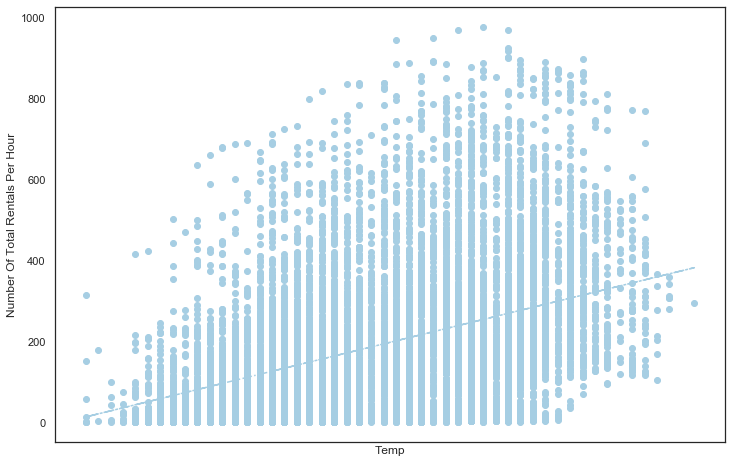

In [149]:
#Temperature
plt.figure(figsize=(12,8))
plt.scatter(x="temp", y="count", data=train)
plt.xlabel('Temp')
plt.ylabel('Number Of Total Rentals Per Hour')
plt.xticks([])
#plt.title('Overview of the Number of Total Rentals Per Hour')
poly = np.polyfit(train['temp'], train['count'], 1)
z=np.polyval(poly, train['temp'])
plt.plot(train['temp'], z, '-.')
plt.show()

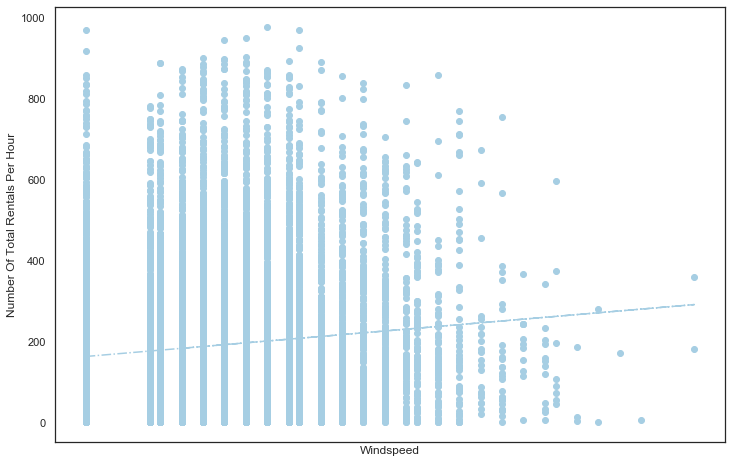

In [150]:
#Windspeed
plt.figure(figsize=(12,8))
plt.scatter(x="windspeed", y="count", data=train)
plt.xlabel('Windspeed')
plt.ylabel('Number Of Total Rentals Per Hour')
plt.xticks([])
#plt.title('Overview of the Number of Total Rentals Per Hour')
poly = np.polyfit(train['windspeed'], train['count'], 1)
z=np.polyval(poly, train['windspeed'])
plt.plot(train['windspeed'], z, '-.')
plt.show()

Text(0, 0.5, 'count')

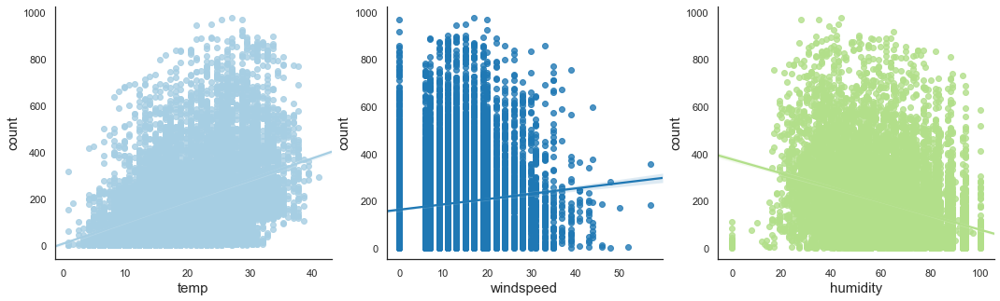

In [151]:

fig,(ax1,ax2,ax3) = plt.subplots(ncols=3)
fig.set_size_inches(18, 5)
sns.set(style='white')
sns.despine()
ax1=sns.regplot(x="temp", y="count", data=train,ax=ax1)
ax2=sns.regplot(x="windspeed", y="count", data=train,ax=ax2)
ax3=sns.regplot(x="humidity", y="count", data=train,ax=ax3)

#ax1.set(xlabel='temp',ylabel='count')
ax1.set_xlabel('temp',fontsize=15)
ax1.set_ylabel('count',fontsize=15)
ax2.set_xlabel('windspeed',fontsize=15)
ax2.set_ylabel('count',fontsize=15)
ax3.set_xlabel('humidity',fontsize=15)
ax3.set_ylabel('count',fontsize=15)


气温低于10，高于30度，租车人数较少-太冷太热都会抑制租车需求

风速越大，租车人数越少-大风抑制租车需求

空气湿度越高，租车人数越少-干爽的天气骑车比较舒适

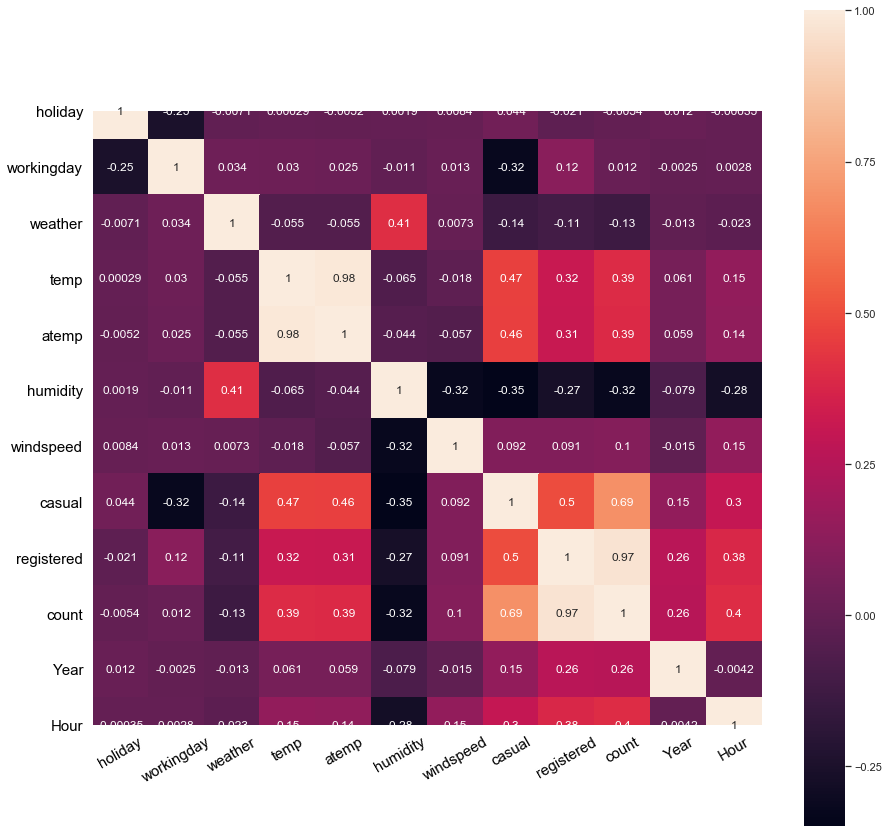

In [164]:
cor=train.corr()

fig=plt.figure(figsize=(15,15))
sns.set(style='white')
sns.heatmap(cor,vmax=1,square=True,annot=True)
plt.xticks(fontsize=15,color='black',rotation=30)
plt.yticks(fontsize=15,color='black')
#plt.savefig('test2.jpg')
plt.show()

In [165]:
cor['count'].sort_values(ascending=False)

count         1.000000
registered    0.970948
casual        0.690414
Hour          0.400601
temp          0.394454
atemp         0.389784
Year          0.260403
windspeed     0.101369
workingday    0.011594
holiday      -0.005393
weather      -0.128655
humidity     -0.317371
Name: count, dtype: float64